# Clone repo to access resources

In [1]:
!git clone https://github.com/idealo/cnn-exposed.git

Cloning into 'cnn-exposed'...
remote: Enumerating objects: 42, done.
remote: Counting objects: 100% (42/42), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 42 (delta 10), reused 37 (delta 5), pack-reused 0
Unpacking objects: 100% (42/42), done.


In [2]:
cd cnn-exposed/

/content/cnn-exposed


# Setup

### Install lucid
(Colab already comes with lucid preinstalled, so this step can be skipped if desired)

In [3]:
!pip install lucid

In [4]:
# import packages
import os
import pathlib
import numpy as np
import tensorflow as tf

# import lucid functionalities
import lucid.optvis.param as param
import lucid.optvis.render as render
import lucid.optvis.transform as transform
import lucid.optvis.objectives as objectives
from lucid.modelzoo.vision_base import Model

# import keras specific dependencies
from keras import backend as K
from keras.applications.mobilenet import MobileNet
from keras.models import load_model
from keras.models import Model as KerasModel

import matplotlib.pyplot as plt

Using TensorFlow backend.


In [0]:
path_resources = pathlib.Path('resources/visualization/')

# Visualization methods for CNNs

We will cover three visualizations


1.   Filter visualizations
2.   Output class visualizations

We will use the awesome [Lucid](https://github.com/tensorflow/lucid) package for all visualization techniques. Also check out the [distill.pub](https://distill.pub) articles for more details on CNN visualizations, as well as links to many super helpful Colab notebooks.



## Feature Visualization by Optimization

### source: https://distill.pub/2017/feature-visualization/


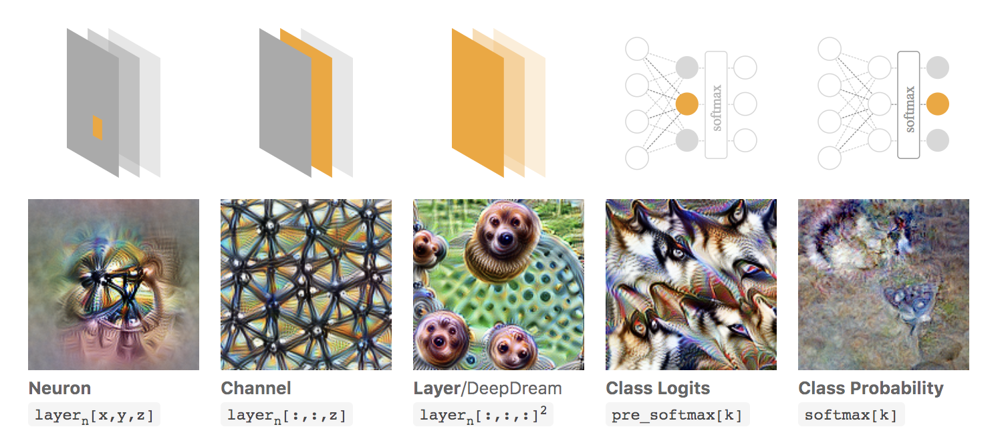

In [6]:
# Different levels of visualization
from IPython.display import Image
Image(filename=os.path.join(path_resources, 'vis_opt1.png'), width=1000, height=450)

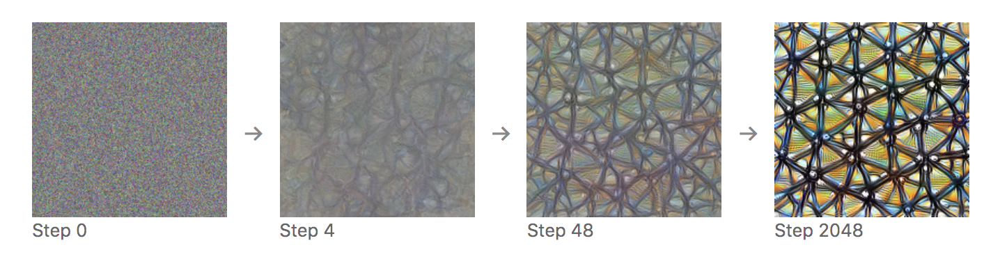

In [7]:
# The visualization changes as the model learning progresses
Image(filename=os.path.join(path_resources, 'vis_opt2.png'), width=1000, height=250)

#### Declare some helper functions

In [0]:
def plot_filter_vis(images, cols=6):
    rows = int(len(images)/cols)+1
  
    for i, image in enumerate(images):
        plt.subplot(rows, images, i+1)
        plt.imshow(image[0])
        plt.axis('off')
        plt.title(image[1])
   
    plt.show()
  
  
def convert_model(model_keras, session, tf_model_file):
    """Convert Keras to TF model and save it."""
    frozen_graph_def = tf.graph_util.convert_variables_to_constants(
          session,
          session.graph_def,
          [model_keras.outputs[-1].op.name],
          )

    with open(tf_model_file, 'wb') as f:
        f.write(frozen_graph_def.SerializeToString())
      
    print('saved model to {}'.format(tf_model_file))
  
  

class ModelLucid(Model):
    """Helper class that adds attributes to TF model for Lucid."""
    def __init__(self, model_path, labels_path, input_name, image_shape=None, 
               image_value_range=None):
        self.model_path = model_path
        self.labels_path = labels_path
        self.input_name = input_name
        self.image_shape = [224, 224, 3]
        self.image_value_range = [-1, 1]
        super().__init__()


def get_model_lucid(model_keras, tf_model_file):
    input_name = model_keras.input.name
    model_lucid = ModelLucid(tf_model_file, None, input_name)
    model_lucid.load_graphdef()
    return model_lucid

# Model Setup
For the following visualizations we are going to use **MobileNet** pretrained on ImageNet. You could easily switch to any of the other pretrained CNNs available in Keras (note that layer indices will change for other CNNs).

In [9]:
WORK_DIR = os.getcwd()
tf_model_file=os.path.join(WORK_DIR, 'model_tf.pb')

tf.reset_default_graph()
sess = tf.Session()
K.set_session(sess)

# use MobileNet pretrained on ImageNet
model_keras = MobileNet(include_top=True)

# convert Keras model to TF and save it
convert_model(
    model_keras=model_keras,
    session=sess,
    tf_model_file=tf_model_file,
)

# get Lucid compatible model
model_lucid = get_model_lucid(model_keras, tf_model_file)

Instructions for updating:
Colocations handled automatically by placer.


Instructions for updating:
Colocations handled automatically by placer.


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.compat.v1.graph_util.convert_variables_to_constants


Instructions for updating:
Use tf.compat.v1.graph_util.convert_variables_to_constants


Instructions for updating:
Use tf.compat.v1.graph_util.extract_sub_graph


Instructions for updating:
Use tf.compat.v1.graph_util.extract_sub_graph


INFO:tensorflow:Froze 137 variables.


INFO:tensorflow:Froze 137 variables.


INFO:tensorflow:Converted 137 variables to const ops.


INFO:tensorflow:Converted 137 variables to const ops.


saved model to /content/cnn-exposed/model_tf.pb


## Filter visualizations

We are going to visualize the convolutional filters from MobileNet at layers 23, 51, and 79.

To get more details on the visualizations shown here check out https://distill.pub/2017/feature-visualization/#enemy-of-feature-vis

In [0]:
# we are maximizing in decorrelated FFT
# visualizations will have size 256x256
param_f = lambda: param.image(256, fft=True, decorrelate=True)


running conv layer 23
running filter 0
Instructions for updating:
Use tf.cast instead.


Instructions for updating:
Use tf.cast instead.


512 5.2249403



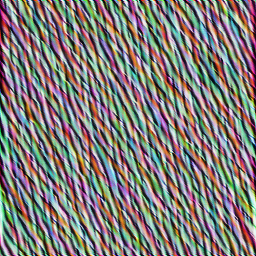

running filter 13
512 4.110602



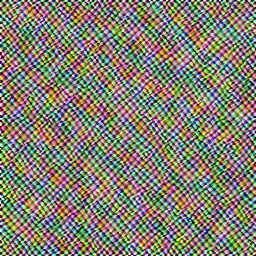

running filter 23
512 2.5726542



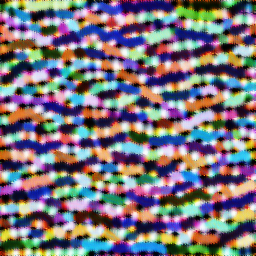

running filter 28
512 2.4407823



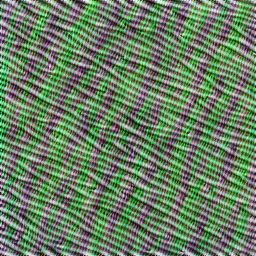

running filter 43
512 3.6438396



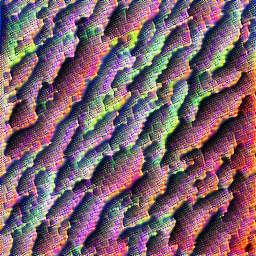

running filter 45
512 5.617516



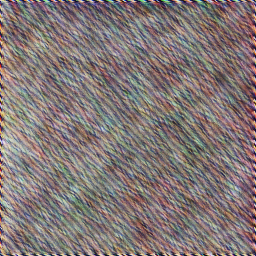


running conv layer 51
running filter 2
512 5.760465



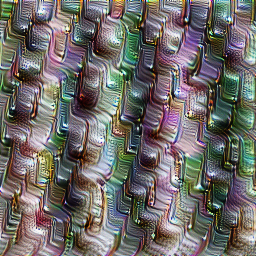

running filter 3
512 7.3324223



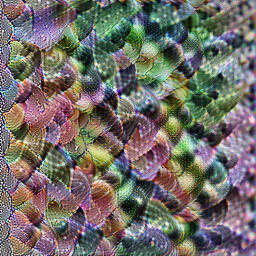

running filter 15
512 6.7416735



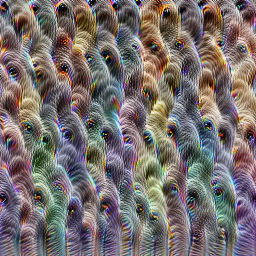

running filter 17
512 6.072466



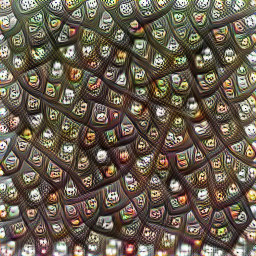

running filter 36
512 3.4601674



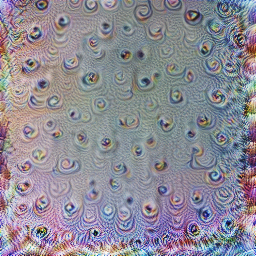

running filter 48
512 15.897521



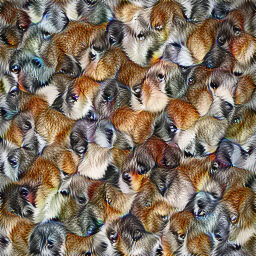


running conv layer 79
running filter 17
512 15.71861



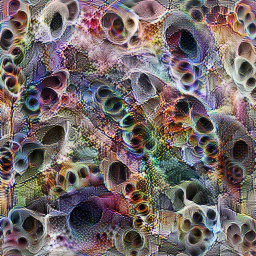

running filter 20
512 9.718511



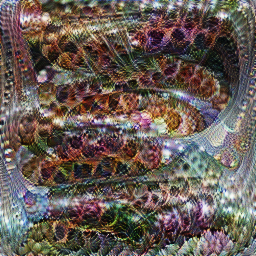

running filter 26
512 18.062422



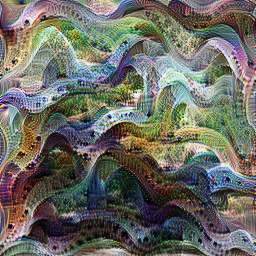

running filter 28
512 14.687989



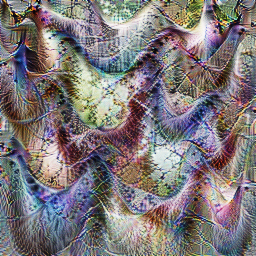

running filter 44
512 7.961446



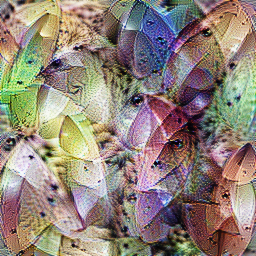

running filter 38
512 14.729378



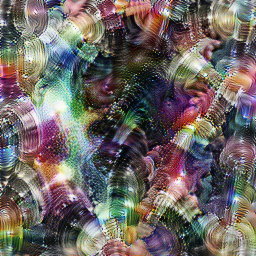

In [11]:
# loop through layers and filters
# these are specific for MobileNet
conv_layers = [23, 51, 79]
filters = [
    [0, 13, 23, 28, 43, 45],
    [2, 3, 15, 17, 36, 48],
    [17, 20, 26, 28, 44, 38],
    ]

filter_vis = []

for i, conv_layer in enumerate(conv_layers):
    print('\nrunning conv layer {}'.format(conv_layer))
  
    for f in filters[i]:
        print('running filter {}'.format(f))
      
        layer_render = model_keras.layers[conv_layer].output.name.split(':')[0]+':'+str(f)
        render.render_vis(model_lucid, layer_render, param_f)
 

## Output class visualizations

We are using the logits, as they generally produce better visualizations than normalized class probabilities.


great grey owl:
Instructions for updating:
Use tf.cast instead.


Instructions for updating:
Use tf.cast instead.


512 90.816605



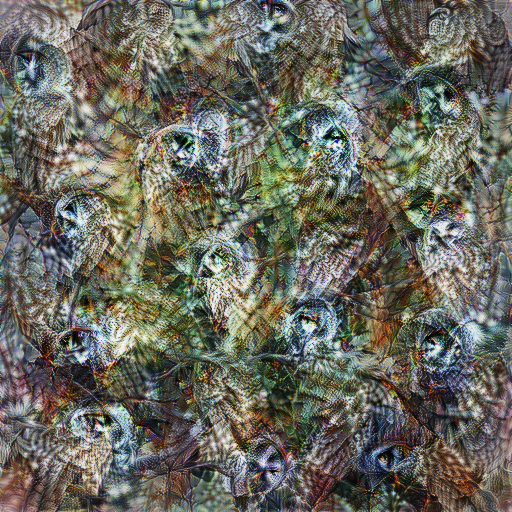


jellyfish:
512 93.98508



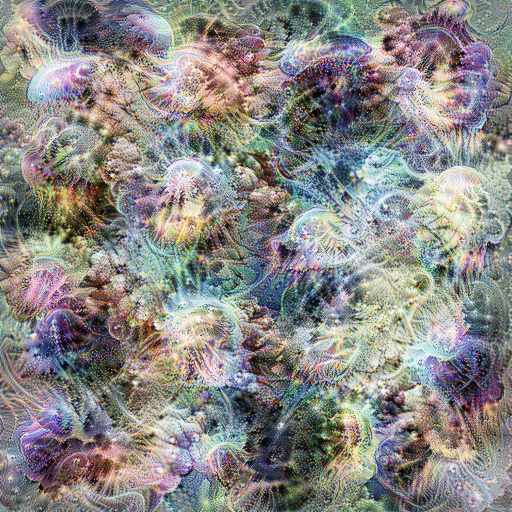


balloon:
512 90.17975



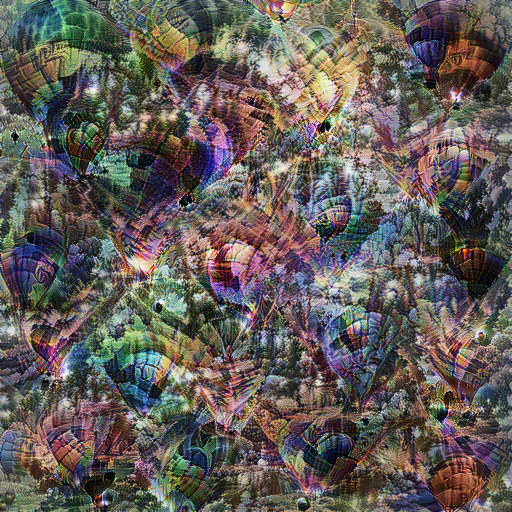


restaurant:
512 63.983925



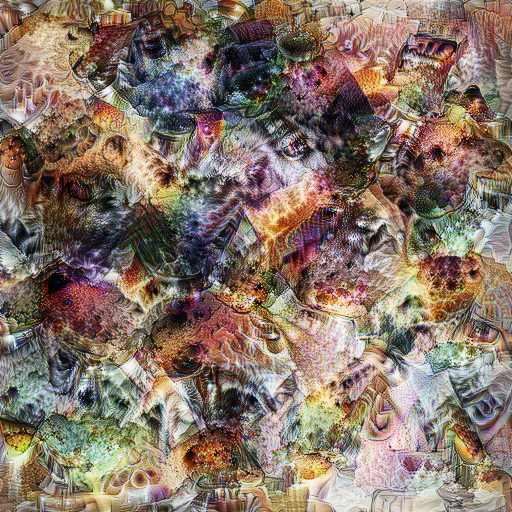

In [12]:
output_nodes = {
    24: 'great grey owl',
    107: 'jellyfish',
    417: 'balloon',
    762: 'restaurant'
}

param_f = lambda: param.image(512, fft=True, decorrelate=True)

for i, j in output_nodes.items():
    print('\n{}:'.format(j))
    layer_render = model_keras.layers[-3].output.name.split(':')[0]+':'+str(i)
    render.render_vis(model_lucid, layer_render, param_f)

## MobileNet Aesthetic
We are going to visualize the output nodes of [MobileNet Aesthetic](https://github.com/idealo/image-quality-assessment/tree/master/models/MobileNet)

In [0]:
WORK_DIR = os.getcwd()
tf_model_file=os.path.join(WORK_DIR, 'model_tf.pb')

tf.reset_default_graph()
sess = tf.Session()
K.set_session(sess)

In [14]:
# We need to access the pre softmax logits of MobileNet Aesthetic
# it is not straightforward in Keras if activation is not a separate layer
# hence we build a new model without softmax
from keras.layers import Dense

# load MobileNet Aesthetic
model_keras = load_model(os.path.join(path_resources,'mobilenet_aesthetic_0.07.hdf5'))

# cut off last dense layer
model_keras_cut = KerasModel(model_keras.input, model_keras.layers[-2].output)

# create model with new Dense layer without softmax
x = Dense(10)(model_keras_cut.output)

# set the dense weights from MobileNet Aesthetic
model_keras_logits = KerasModel(model_keras_cut.input, x)
model_keras_logits.layers[-1].set_weights(model_keras.layers[-1].get_weights())

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [15]:
convert_model(
    model_keras=model_keras_logits,
    session=sess,
    tf_model_file=tf_model_file,
)

# get Lucid compatible model
model_lucid = get_model_lucid(model_keras, tf_model_file)

INFO:tensorflow:Froze 137 variables.


INFO:tensorflow:Froze 137 variables.


INFO:tensorflow:Converted 137 variables to const ops.


INFO:tensorflow:Converted 137 variables to const ops.


saved model to /content/cnn-exposed/model_tf.pb



Aesthetic score 0:
512 11.038118



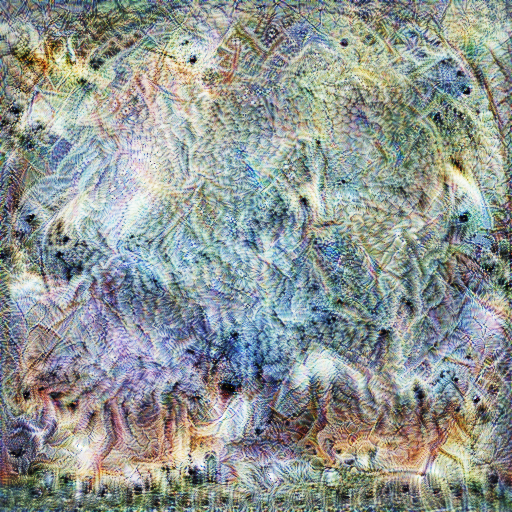


Aesthetic score 1:
512 23.012455



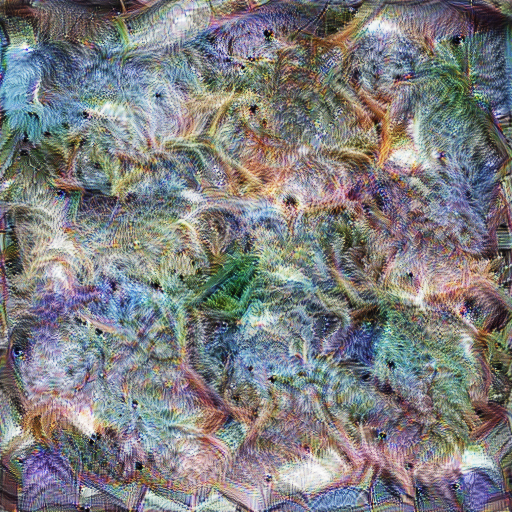


Aesthetic score 2:
512 22.848257



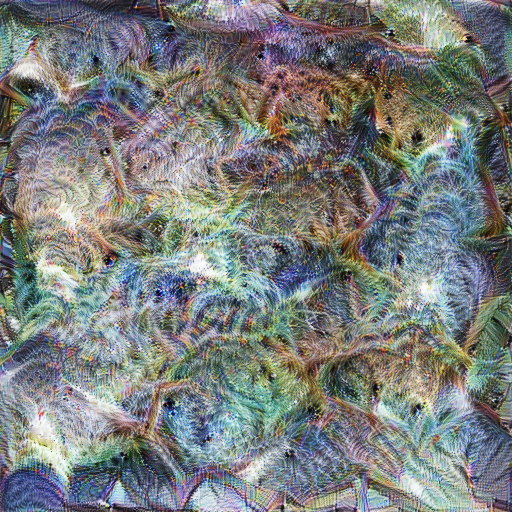


Aesthetic score 3:
512 23.493149



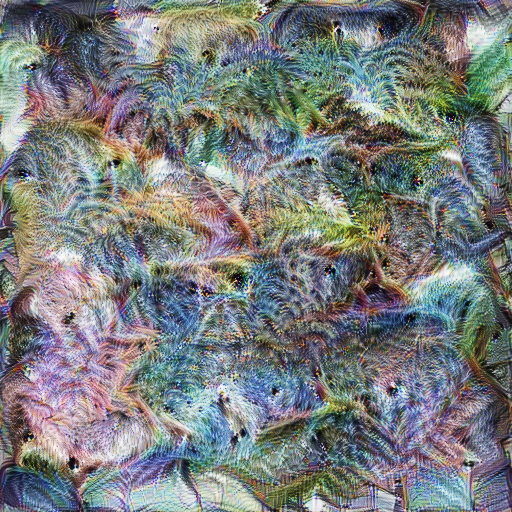


Aesthetic score 4:
512 21.409431



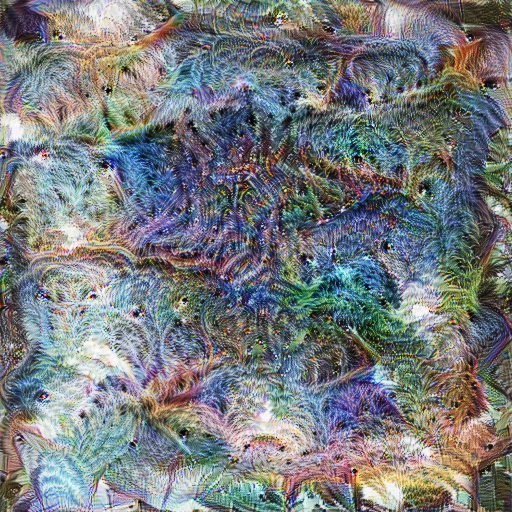


Aesthetic score 5:
512 17.210682



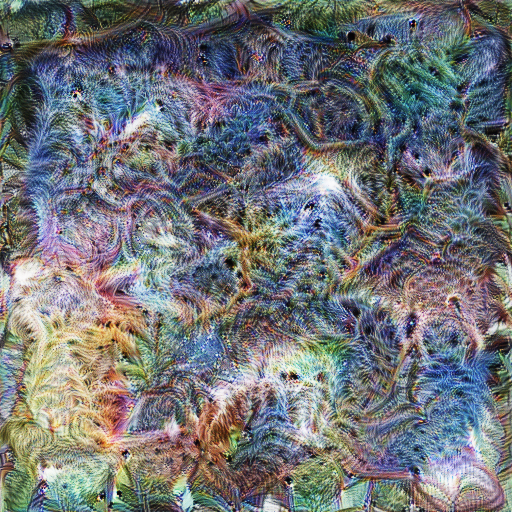


Aesthetic score 6:
512 13.611982



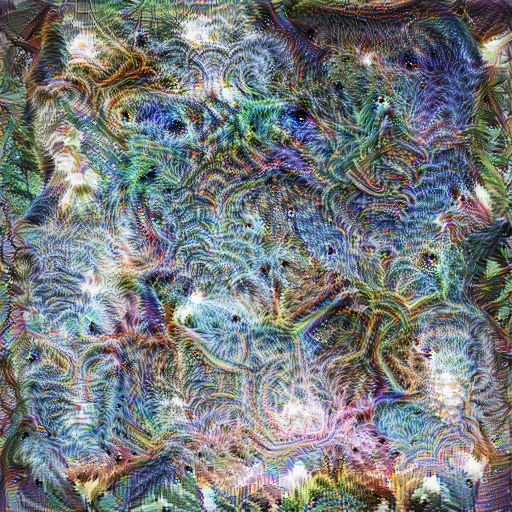


Aesthetic score 7:
512 13.22897



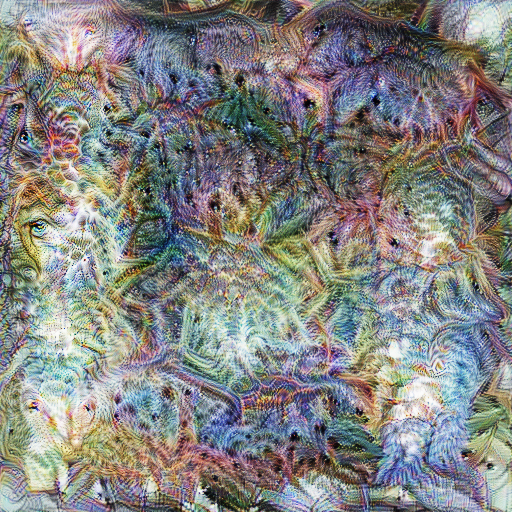


Aesthetic score 8:
512 28.777266



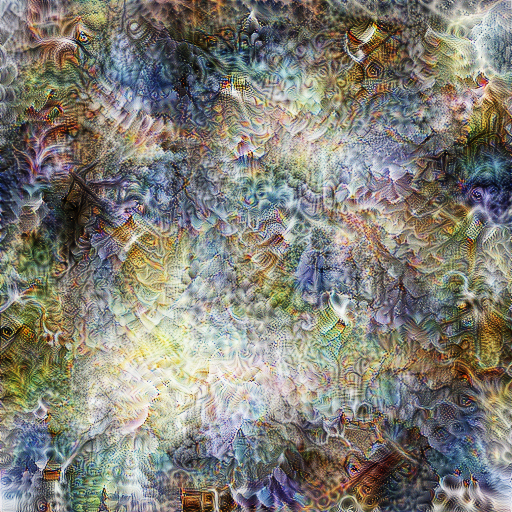


Aesthetic score 9:
512 19.647562



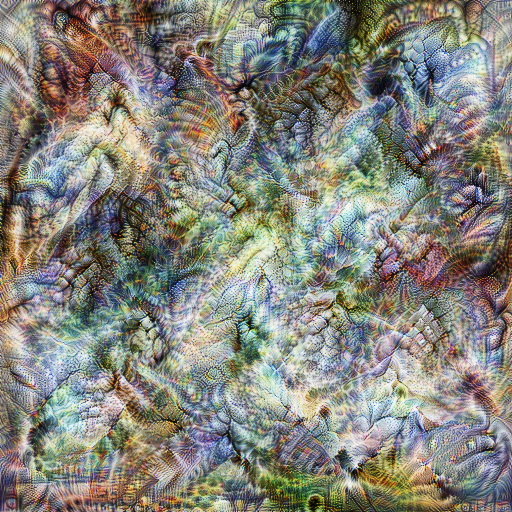

In [16]:
param_f = lambda: param.image(512, fft=True, decorrelate=True)

for i in range(10):
    print('\nAesthetic score {}:'.format(i))
    layer_render = model_keras_logits.layers[-1].output.name.split(':')[0]+':'+str(i)
    render.render_vis(model_lucid, layer_render, param_f)